In [1]:
from ipynb.fs.full.TemplateML import *
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

###############################
import pandas as pd
import numpy as np
import glob
#For ploting 
import  matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
plt.style.use('fivethirtyeight')
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 8
matplotlib.rcParams['ytick.labelsize'] = 8
matplotlib.rcParams['text.color'] = 'k'
plt.style.use('fivethirtyeight')
pd.set_option("display.max_rows", None, "display.max_columns", None)
from nltk import re
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix,precision_score, recall_score,roc_auc_score,roc_curve, auc, f1_score,classification_report 
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
#####################


















# import cufflinks as cf
# cf.go_offline(connected = True )
    
# import plotly.express as px
    
# import plotly.graph_objects as go
# import plotly.offline as pyo
# pyo.init_notebook_mode()
    
# from plotly.subplots import make_subplots 
# import plotly.figure_factory as ff 

In [2]:
pip install cufflinks

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install lightgbm

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install -U imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [5]:
data = pd.read_excel("marketing_campaign1.xlsx")

### Data Analysis

In [6]:
basicanalysis(data)

Shape is:
 (2240, 29)

 Columns are:
 Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

 Types are:
 ID                       int64
Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer             object
Recency                  int64
MntWines                 int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         

In [7]:
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [8]:
data.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [9]:
data['Income'].fillna(0,inplace=True)

### Univariate Analysis

In [10]:
for col in data.columns:
    print(col)
    print(data[col].unique(),'\n')

ID
[5524 2174 4141 ... 7270 8235 9405] 

Year_Birth
[1957 1954 1965 1984 1981 1967 1971 1985 1974 1950 1983 1976 1959 1952
 1987 1946 1980 1949 1982 1979 1951 1969 1986 1989 1963 1970 1973 1943
 1975 1996 1968 1964 1977 1978 1955 1966 1988 1948 1958 1972 1960 1945
 1991 1962 1953 1961 1956 1992 1900 1893 1990 1947 1899 1993 1994 1941
 1944 1995 1940] 

Education
['Graduation' 'PhD' 'Master' 'Basic' '2n Cycle'] 

Marital_Status
['Single' 'Together' 'Married' 'Divorced' 'Widow' 'Alone' 'Absurd' 'YOLO'] 

Income
[58138. 46344. 71613. ... 56981. 69245. 52869.] 

Kidhome
[0 1 2] 

Teenhome
[0 1 2] 

Dt_Customer
['2012-09-04' '2014-03-08' '2013-08-21' '2014-02-10' '2014-01-19'
 '2013-09-09' '2012-11-13' '2013-05-08' '2013-06-06' '2014-03-13'
 '2013-11-15' '2012-10-10' '2012-11-24' '2012-12-24' '2012-08-31'
 '2013-03-28' '2012-11-03' '2012-08-08' '2013-01-06' '2012-12-23'
 '2014-01-11' '2013-03-18' '2013-01-02' '2013-05-27' '2013-02-20'
 '2013-05-31' '2013-11-22' '2014-05-22' '2013-05-11' '20

In [11]:
data.Income = data.Income.astype('int64')
data.Dt_Customer = pd.to_datetime(data.Dt_Customer)

data.dtypes

ID                              int64
Year_Birth                      int64
Education                      object
Marital_Status                 object
Income                          int64
Kidhome                         int64
Teenhome                        int64
Dt_Customer            datetime64[ns]
Recency                         int64
MntWines                        int64
MntFruits                       int64
MntMeatProducts                 int64
MntFishProducts                 int64
MntSweetProducts                int64
MntGoldProds                    int64
NumDealsPurchases               int64
NumWebPurchases                 int64
NumCatalogPurchases             int64
NumStorePurchases               int64
NumWebVisitsMonth               int64
AcceptedCmp3                    int64
AcceptedCmp4                    int64
AcceptedCmp5                    int64
AcceptedCmp1                    int64
AcceptedCmp2                    int64
Complain                        int64
Z_CostContac

In [12]:
data['Year_Old'] = data.apply(lambda x : 2014 - x.Year_Birth, axis = 1) # Because data has been written in 2014. 
data.drop(columns = 'Year_Birth', inplace = True) # Drop column 'Year_Birth'
data.head()

,ID,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Year_Old
0,5524,Graduation,Single,58138,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,57
1,2174,Graduation,Single,46344,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,60
2,4141,Graduation,Together,71613,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,49
3,6182,Graduation,Together,26646,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,30
4,5324,PhD,Married,58293,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,33


In [13]:
data['Year_Customer'] = 2014 - data.Dt_Customer.dt.year # Because data has been written in 2014. 
data.drop(columns = 'Dt_Customer', inplace = True)
data.head()

,ID,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Year_Old,Year_Customer
0,5524,Graduation,Single,58138,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,57,2
1,2174,Graduation,Single,46344,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,60,0
2,4141,Graduation,Together,71613,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,49,1
3,6182,Graduation,Together,26646,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,30,0
4,5324,PhD,Married,58293,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,33,0


In [14]:
data = data.drop(columns = ['ID', 'Z_CostContact', 'Z_Revenue']) # We don't need column ID and feature 'Z_CostContac', 'Z_Revenue' becuase they have only one variable. 
data.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Year_Old,Year_Customer
0,Graduation,Single,58138,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,57,2
1,Graduation,Single,46344,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,60,0
2,Graduation,Together,71613,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,49,1
3,Graduation,Together,26646,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,30,0
4,PhD,Married,58293,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,33,0


In [15]:
new_col = [fea for fea in data.columns if fea != 'Response'] # reorder columns to make correlation more prettier
new_col.append('Response')

data = data[new_col]
data.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Year_Old,Year_Customer,Response
0,Graduation,Single,58138,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,57,2,1
1,Graduation,Single,46344,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,60,0,0
2,Graduation,Together,71613,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,49,1,0
3,Graduation,Together,26646,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,30,0,0
4,PhD,Married,58293,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,33,0,0


### Exploratory Data Analysis

In [16]:
categorical=[]
numerical = []
for col in data.columns:
    if (data[col].dtype == 'object' or data[col].nunique() == 2):
        print(col,'\n',data[col].value_counts(),'\n')
        categorical.append(col)
    else:
        numerical.append(col)

Education 
 Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64 

Marital_Status 
 Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
YOLO          2
Absurd        2
Name: Marital_Status, dtype: int64 

AcceptedCmp3 
 0    2077
1     163
Name: AcceptedCmp3, dtype: int64 

AcceptedCmp4 
 0    2073
1     167
Name: AcceptedCmp4, dtype: int64 

AcceptedCmp5 
 0    2077
1     163
Name: AcceptedCmp5, dtype: int64 

AcceptedCmp1 
 0    2096
1     144
Name: AcceptedCmp1, dtype: int64 

AcceptedCmp2 
 0    2210
1      30
Name: AcceptedCmp2, dtype: int64 

Complain 
 0    2219
1      21
Name: Complain, dtype: int64 

Response 
 0    1906
1     334
Name: Response, dtype: int64 



In [17]:
print(categorical)
print(numerical)
print(len(categorical))
print(len(numerical))

['Education', 'Marital_Status', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response']
['Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'Year_Old', 'Year_Customer']
9
17


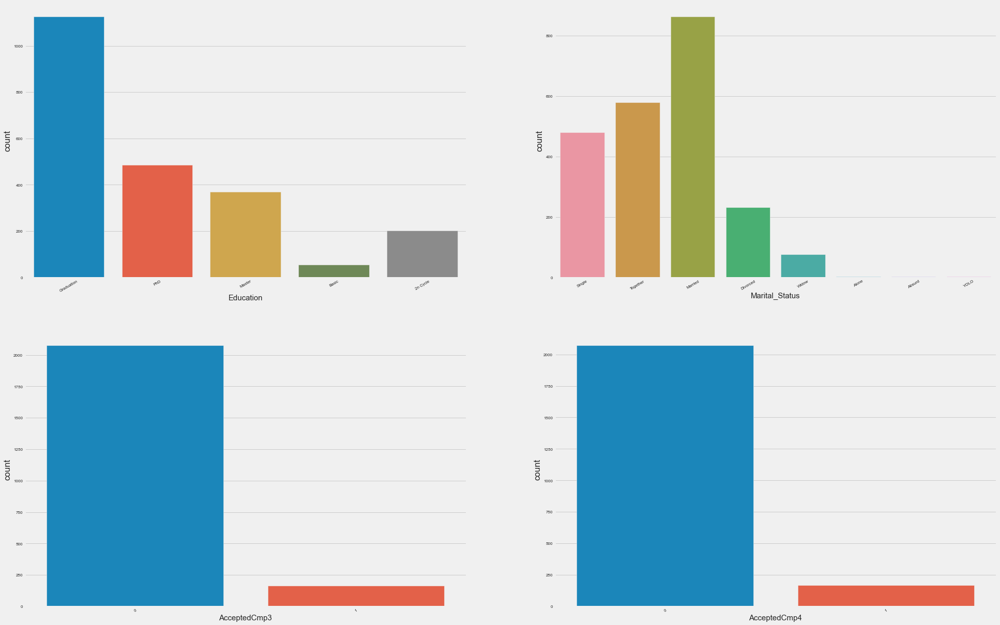

In [18]:
fig = plt.figure(figsize = (30,20))
axes = 220
lst=categorical
for cat in lst[0:4]:
    axes += 1
    fig.add_subplot(axes)
    sns.countplot(data =data, x = cat)
    plt.xlabel(cat,fontsize=15)
    plt.xticks(rotation=30)
plt.show()

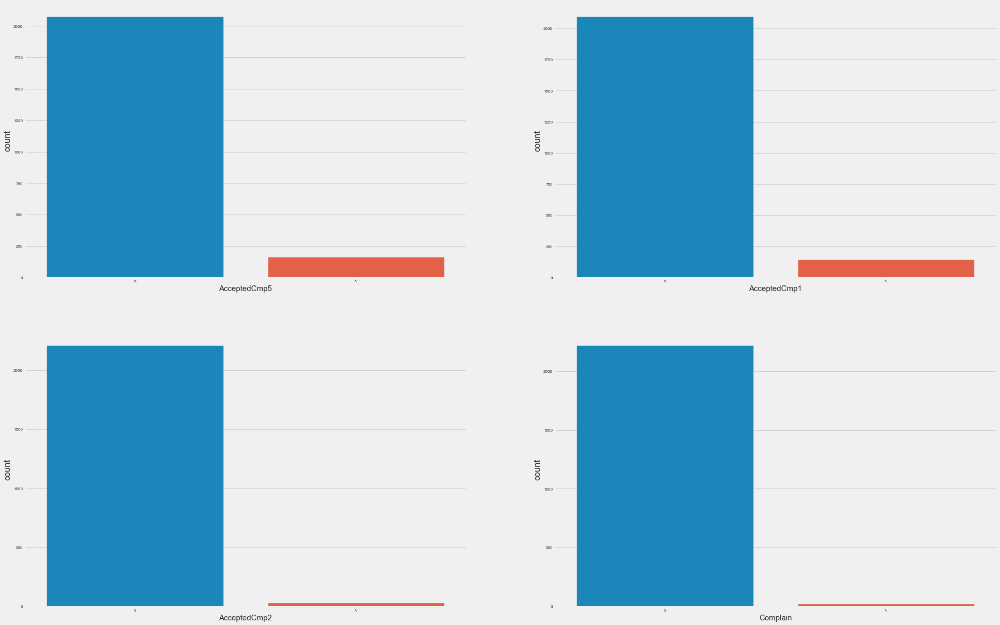

In [19]:
fig = plt.figure(figsize = (30,20))
axes = 220
lst=categorical
for cat in lst[4:8]:
    axes += 1
    fig.add_subplot(axes)
    sns.countplot(data =data, x = cat)
    plt.xlabel(cat,fontsize=15)
    plt.xticks(rotation=30)
plt.show()

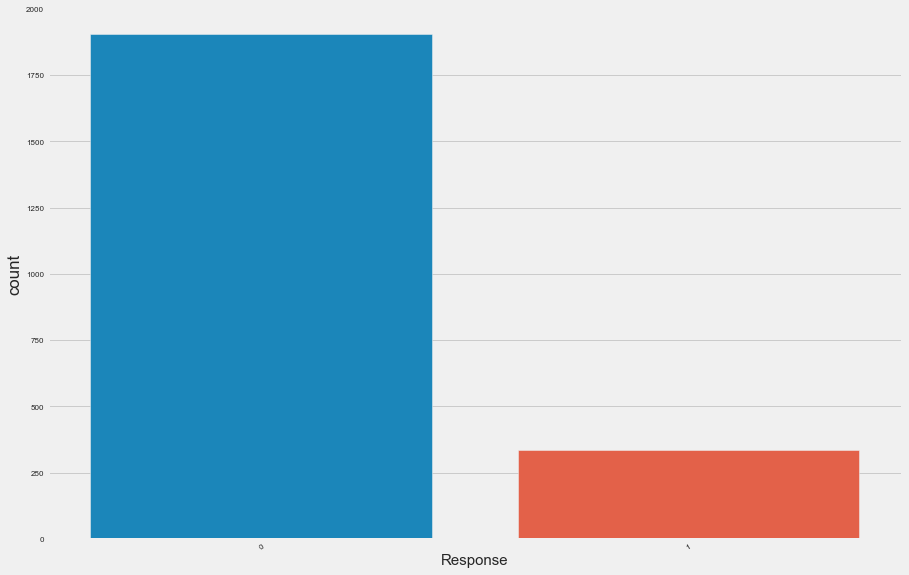

In [20]:
fig = plt.figure(figsize = (30,20))
axes = 220
lst=categorical
for cat in lst[8:]:
    axes += 1
    fig.add_subplot(axes)
    sns.countplot(data =data, x = cat)
    plt.xlabel(cat,fontsize=15)
    plt.xticks(rotation=30)
plt.show()

### Numerical Analysis

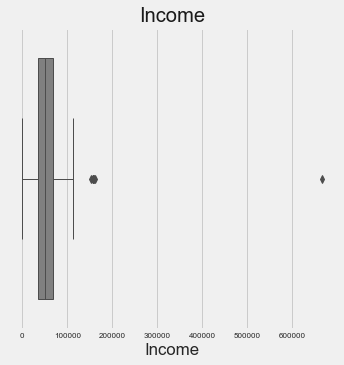

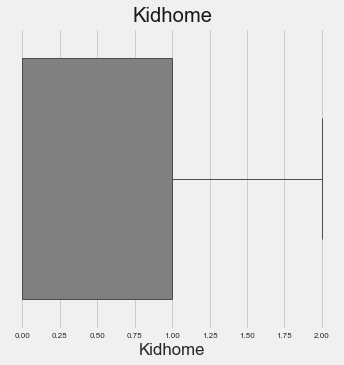

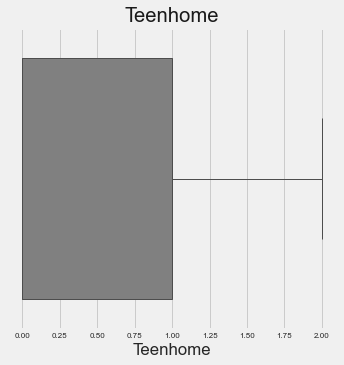

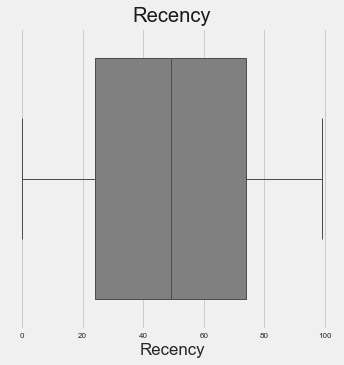

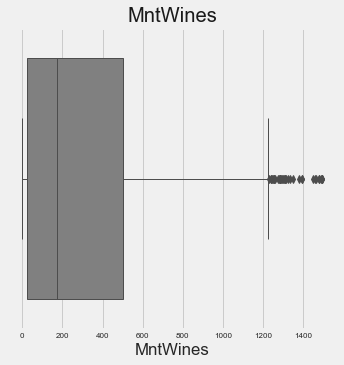

...

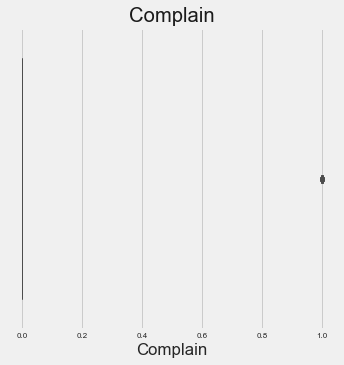

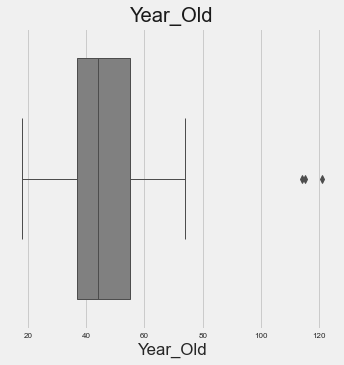

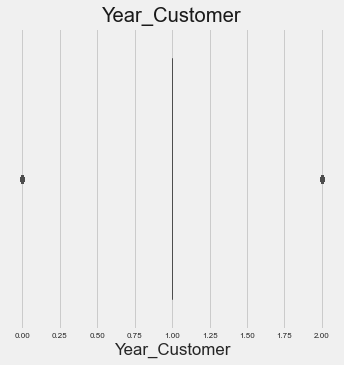

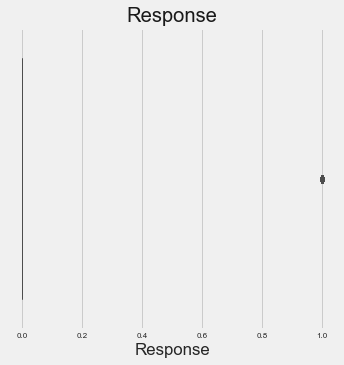

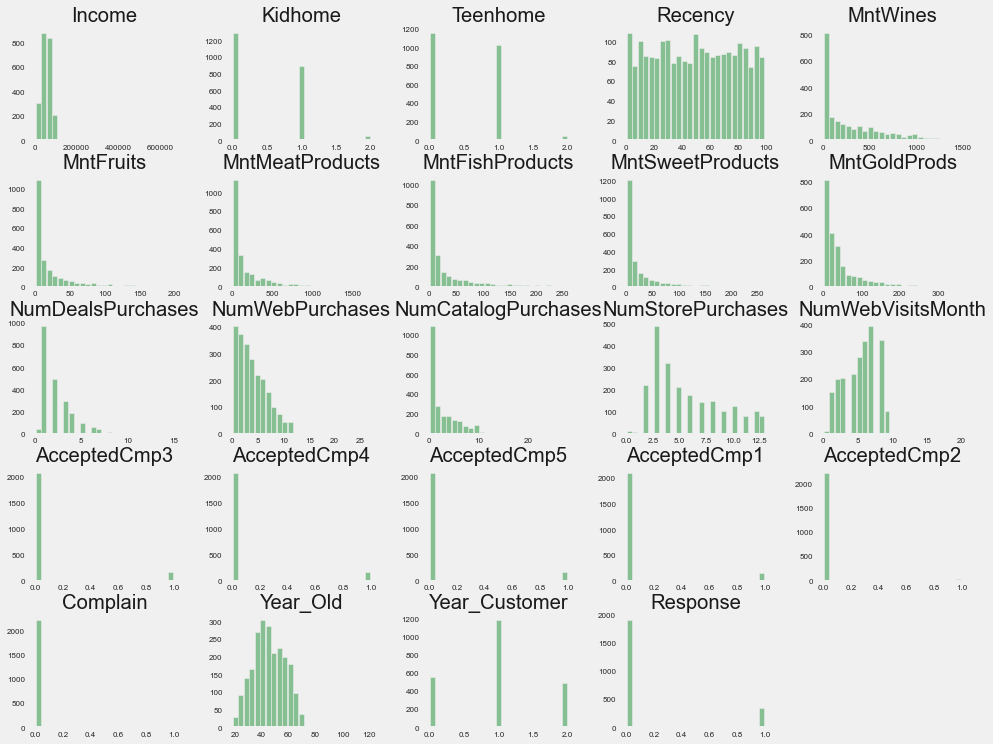

In [21]:
numcolanalysis(data)

count      2240.000000
mean      51687.459375
std       25609.342730
min           0.000000
25%       34722.000000
50%       51075.000000
75%       68289.750000
max      666666.000000
Name: Income, dtype: float64
count    2240.000000
mean        0.444196
std         0.538398
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         2.000000
Name: Kidhome, dtype: float64
count    2240.000000
mean        0.506250
std         0.544538
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         2.000000
Name: Teenhome, dtype: float64
count    2240.000000
mean       49.109375
std        28.962453
min         0.000000
25%        24.000000
50%        49.000000
75%        74.000000
max        99.000000
Name: Recency, dtype: float64
count    2240.000000
mean      303.935714
std       336.597393
min         0.000000
25%        23.750000
50%       173.500000
75%       504.250000
max      1493.000000
Name: MntWines, dtype: f

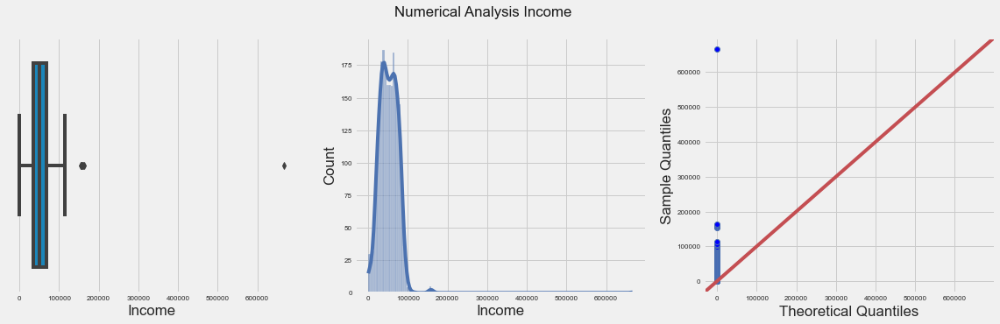

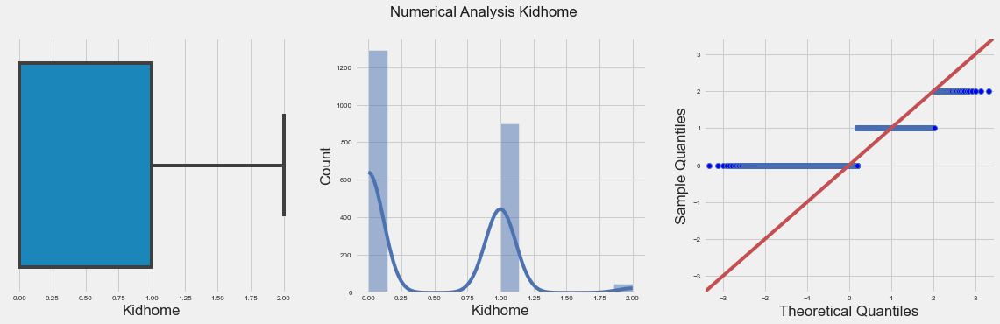

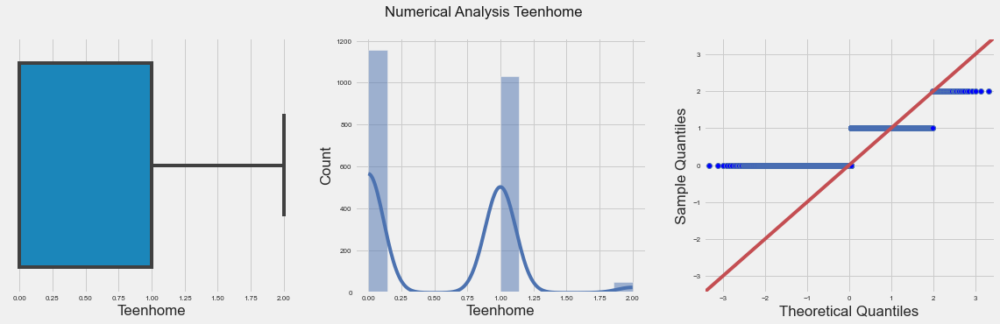

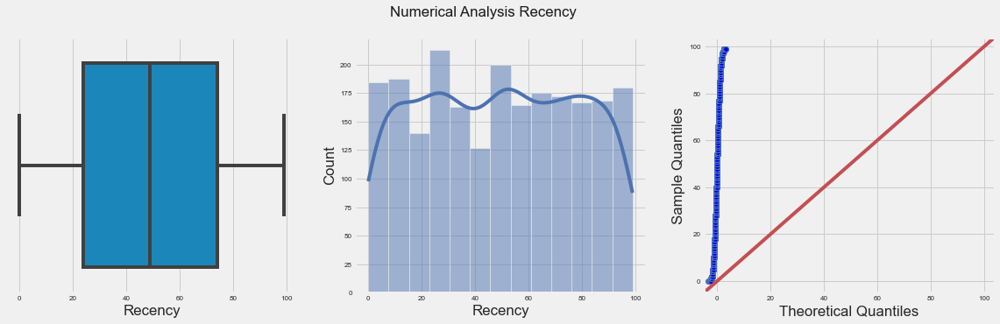

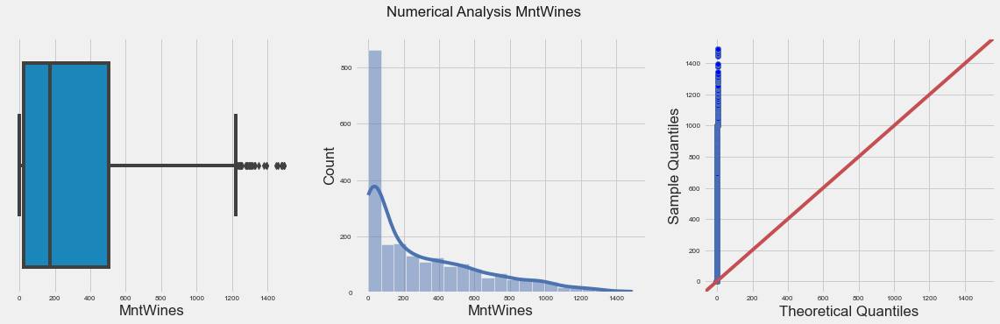

...

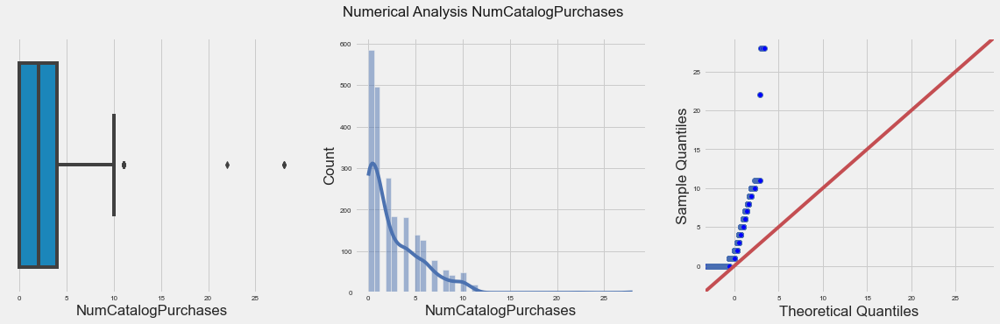

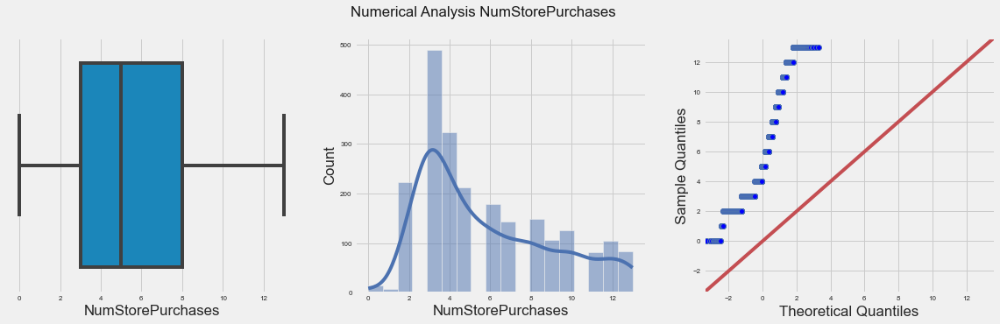

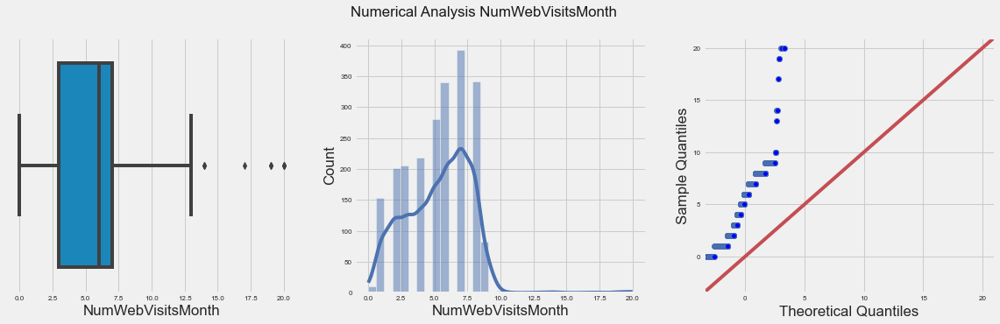

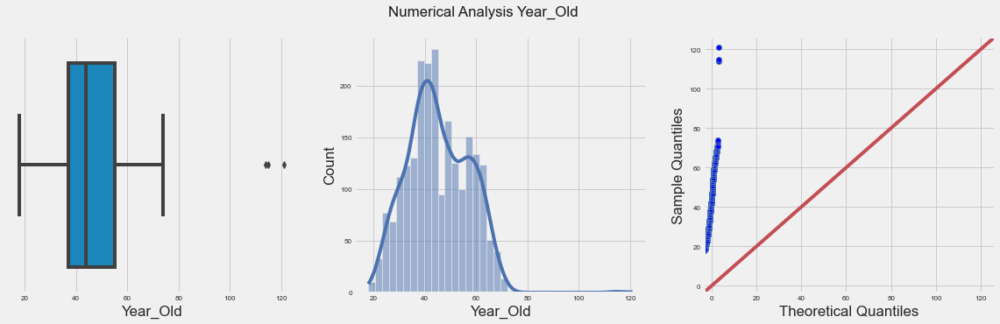

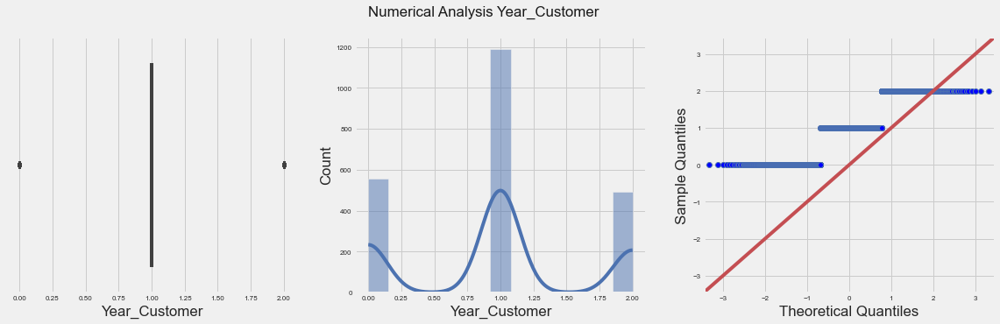

In [22]:
for i in numerical:
    num_plots (data,i)

### Correlation

<AxesSubplot:>

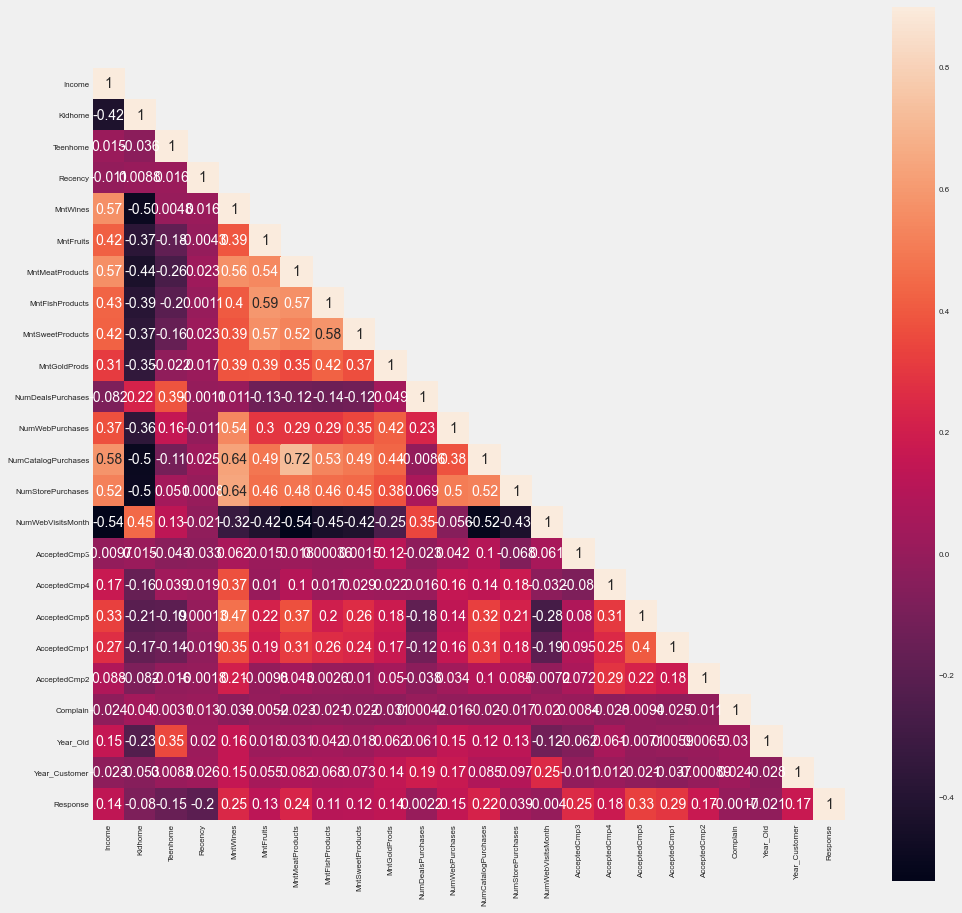

In [23]:
#create correlation
corr = data.corr(method ='pearson')

#convert correlation to numpy array
mask = np.array(corr)

#to mask the repetitive value for each pair
mask[np.tril_indices_from(mask)] = False
fig, ax = plt.subplots(figsize = (20,15))
fig.set_size_inches(15,15)
sns.heatmap(corr, mask = mask, vmax = 0.9, square = True, annot = True)

### Analysis by rate of response

We will see the rate of response by features and get insight of which features occuring response.

Education

Marital_Status

Kidhome

Teenhome

AcceptedCmp5

Complain

Year_Customer

total Accepted

NumDealsPurchases

Categorized NumWebPurchases + NumStorePurchases

Categorized Year_old

Categorized income

Categorized Recency

In [24]:
# Function for response rate 
def response_rate(x) :
    return round(x.mean()*100, 4)

### Education

In [25]:
data.groupby('Education')['Response'].agg(response_rate).sort_values(ascending = False)

Education
PhD           20.7819
Master        15.4054
Graduation    13.4871
2n Cycle      10.8374
Basic          3.7037
Name: Response, dtype: float64

### Maritual Status

In [26]:
data.groupby('Marital_Status')['Response'].agg(response_rate).sort_values(ascending = False)

Marital_Status
Absurd      50.0000
YOLO        50.0000
Alone       33.3333
Widow       24.6753
Single      22.0833
Divorced    20.6897
Married     11.3426
Together    10.3448
Name: Response, dtype: float64

### Kidhome

Response rate is higher in single-like group(Absurb?, YOLO, Anloe, Widow, Single, Divorced). We can get insight that in single, people are more active to marketing campaign.

In [27]:
data.groupby('Kidhome')['Response'].agg(response_rate).sort_values(ascending = False)

Kidhome
0    17.1694
1    12.2358
2     4.1667
Name: Response, dtype: float64

### TeenHome

In [28]:
data.groupby('Teenhome')['Response'].agg(response_rate).sort_values(ascending = False)

Teenhome
0    20.4663
2     9.6154
1     8.9320
Name: Response, dtype: float64

### AcceptedCmp5

In [29]:
data.groupby('AcceptedCmp5')['Response'].agg(response_rate).sort_values(ascending = False)

AcceptedCmp5
1    56.4417
0    11.6514
Name: Response, dtype: float64

Response rate is more higher in group where reponse to previous marketing campian.

### Complain

In [30]:
data.groupby('Complain')['Response'].agg(response_rate).sort_values(ascending = False)

Complain
0    14.9166
1    14.2857
Name: Response, dtype: float64

There isn't significant difference in complain feature.

### Year_Customer

In [31]:
data.groupby('Year_Customer')['Response'].agg(response_rate).sort_values(ascending = False)

Year_Customer
2    26.7206
1    12.9521
0     8.6176
Name: Response, dtype: float64

Response rate is more higher as year of customer is more higher. In business, it is important to maintain loyal customer. We can think 2 years customer as loyal customer, and it is important to focus them in business strategy.

### NumDealsPurchases

In [32]:
data.groupby('NumDealsPurchases')['Response'].agg(response_rate).sort_values(ascending = False)

NumDealsPurchases
10    60.0000
11    60.0000
9     37.5000
0     34.7826
7     20.0000
6     19.6721
5     17.0213
1     16.4948
4     13.7566
3     12.7946
2      9.6579
8      7.1429
12     0.0000
13     0.0000
15     0.0000
Name: Response, dtype: float64

Response rate is more higher in 0, 9, 10, 11 deal purchases. But in 12, 13, 15 deal purchases group never response to marketing campiagn. So we need to make strategy for lower deal purchase and highest deal purchase groups.

In [33]:
data.columns

Index(['Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3',
       'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
       'Complain', 'Year_Old', 'Year_Customer', 'Response'],
      dtype='object')

### Bivariate Analysis

<Figure size 1080x576 with 0 Axes>

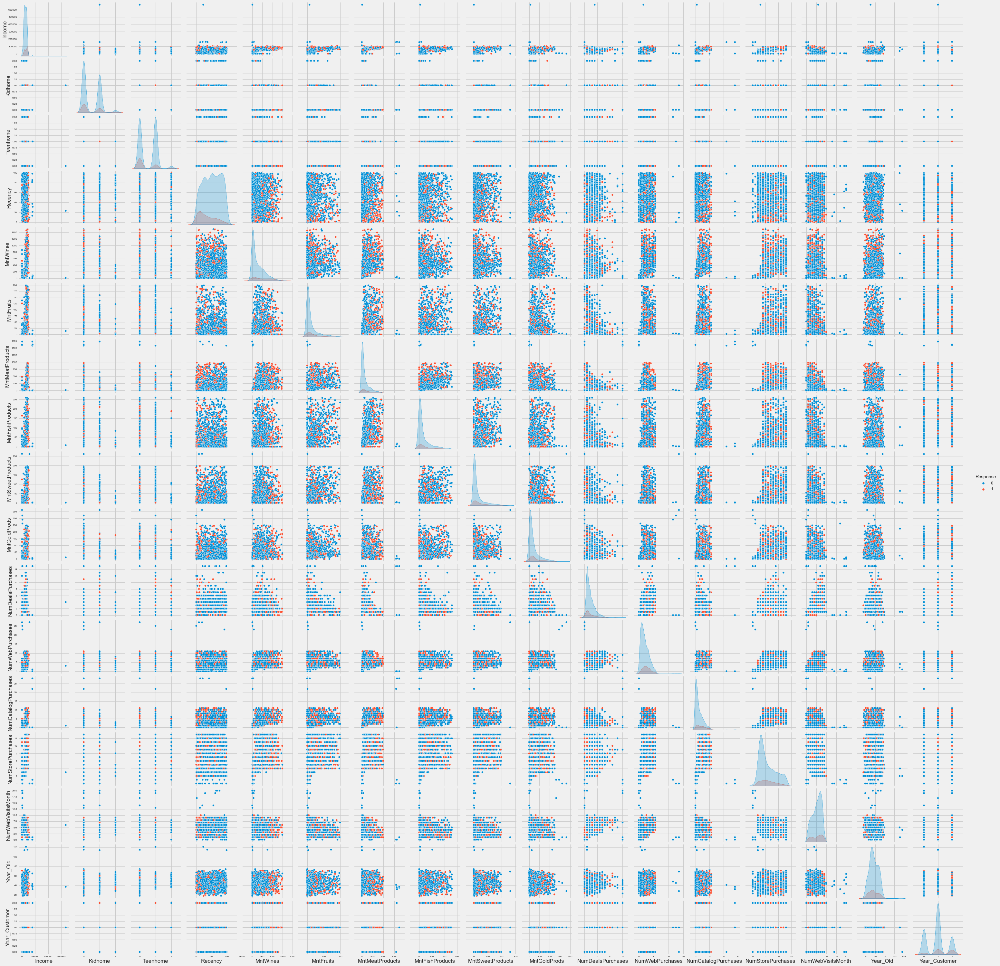

In [34]:
plt.figure(figsize=(15,8))
numerical.append('Response')
sns.pairplot(data[numerical],hue='Response')

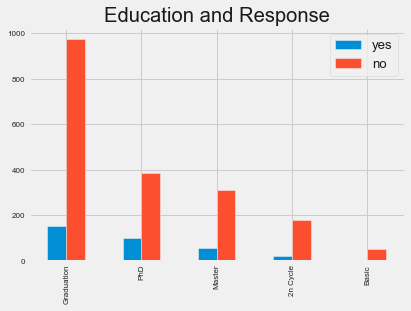

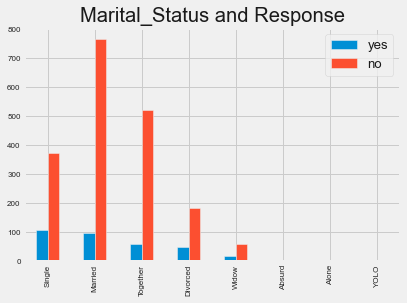

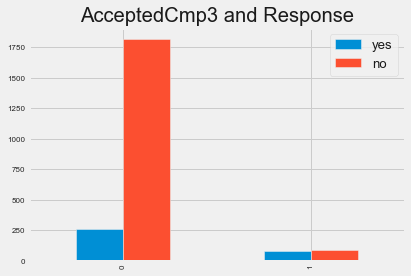

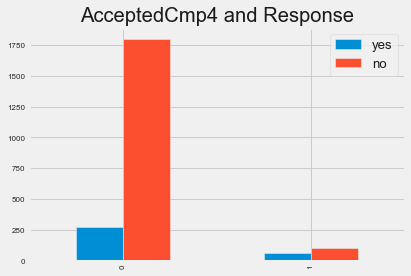

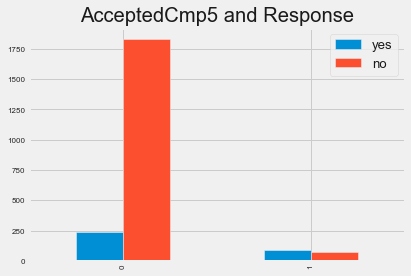

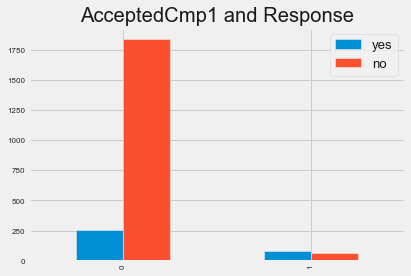

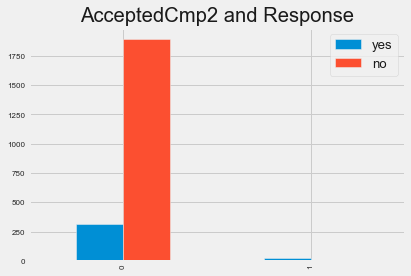

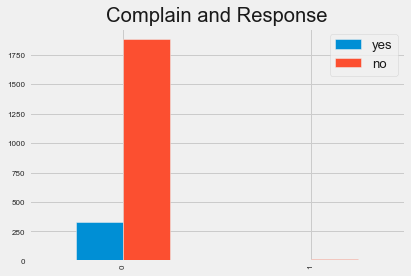

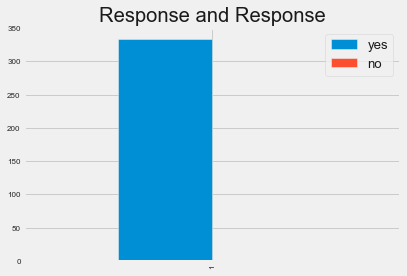

In [35]:
for i in categorical:
    cat_tar(data,'Response',i)

### Feature Selection & Importance 

In [36]:
data.dtypes

Education              object
Marital_Status         object
Income                  int64
Kidhome                 int64
Teenhome                int64
Recency                 int64
MntWines                int64
MntFruits               int64
MntMeatProducts         int64
MntFishProducts         int64
MntSweetProducts        int64
MntGoldProds            int64
NumDealsPurchases       int64
NumWebPurchases         int64
NumCatalogPurchases     int64
NumStorePurchases       int64
NumWebVisitsMonth       int64
AcceptedCmp3            int64
AcceptedCmp4            int64
AcceptedCmp5            int64
AcceptedCmp1            int64
AcceptedCmp2            int64
Complain                int64
Year_Old                int64
Year_Customer           int64
Response                int64
dtype: object

### Encoding 

In [37]:
df = apply_label_encoding(data, cols=['Education','Marital_Status'])
df

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Year_Old,Year_Customer,Response
0,2,4,58138,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,57,2,1
1,2,4,46344,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,60,0,0
2,2,5,71613,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,49,1,0
3,2,5,26646,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,30,0,0
4,4,3,58293,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,33,0,0
5,3,5,62513,0,1,16,520,42,98,0,42,14,2,6,4,10,6,0,0,0,0,0,0,47,1,0
6,2,2,55635,0,1,34,235,65,164,50,49,27,4,7,3,7,6,0,0,0,0,0,0,43,2,0
7,4,3,33454,1,0,32,76,10,56,3,1,23,2,4,0,4,8,0,0,0,0,0,0,29,1,0
8,4,5,30351,1,0,19,14,0,24,3,3,2,1,3,0,2,9,0,0,0,0,0,0,40,1,1
9,4,5,5648,1,1,68,28,0,6,1,1,13,1,1,0,0,20,1,0,0,0,0,0,64,0,0


In [38]:
x,y = XYsplit(df, 'Response')


In [39]:
from sklearn.ensemble import RandomForestClassifier
# define the model
lst = []
model = RandomForestClassifier()
# fit the model
model.fit(x, y)
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
    #print('Feature: %0d, Score: %.5f' % (i,v))
    lst.append(v)
df1= pd.DataFrame()
df1['Features'] = data.columns[:-1]
df1['Score'] = lst
df1
# plot feature importance
# pyplot.bar([x for x in range(len(importance))], importance)
# pyplot.show()

,Features,Score
0,Education,0.023417
1,Marital_Status,0.031667
2,Income,0.070454
3,Kidhome,0.007715
4,Teenhome,0.011679
5,Recency,0.102750
6,MntWines,0.074484
7,MntFruits,0.042057
8,MntMeatProducts,0.073532
9,MntFishProducts,0.040916


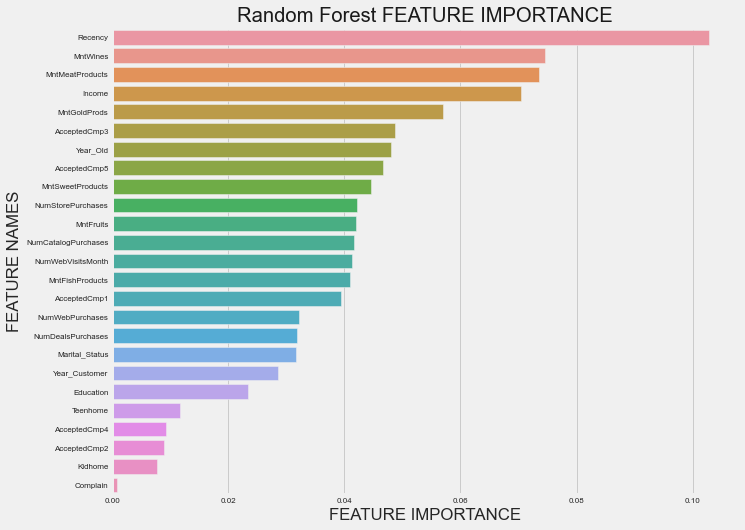

In [40]:
def plot_feature_importance(importance,names,model_type):

    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)

    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

    #Define size of bar plot
    plt.figure(figsize=(10,8))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    #Add chart labels
    plt.title(model_type + ' FEATURE IMPORTANCE')
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')
plot_feature_importance(df1['Score'],df1['Features'], 'Random Forest')

In [41]:
data.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Year_Old,Year_Customer,Response
0,2,4,58138,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,57,2,1
1,2,4,46344,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,60,0,0
2,2,5,71613,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,49,1,0
3,2,5,26646,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,30,0,0
4,4,3,58293,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,33,0,0


### Balancing Target Using Smote Technique

In [43]:
X, trainX, testX, trainY, testY=traintestsplit(df,0.3,random=42, label_col='Response')
print(trainX.shape,testX.shape,trainY.shape,testY.shape)

(1568, 25) (672, 25) (1568,) (672,)


In [44]:
trainX['Response'] = trainY
trainX.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Year_Old,Year_Customer,Response
994,2,2,64587,1,1,49,66,0,16,0,6,20,2,1,1,4,3,0,0,0,0,0,0,60,0,0
2162,2,5,47320,0,1,10,200,19,111,50,15,19,6,5,1,8,6,0,0,0,0,0,0,57,1,0
906,2,4,86429,0,0,10,464,28,873,29,18,37,0,7,4,7,2,0,0,0,1,0,0,53,1,1
572,0,4,38593,1,0,42,51,12,49,17,24,24,3,4,1,3,8,0,0,0,0,0,0,36,1,0
1877,2,3,72905,0,0,52,407,114,445,181,165,203,1,3,7,9,1,0,0,0,1,0,0,56,0,0


In [45]:
newData = sm_sample(trainX,'Response')
newData.shape

Shape of X before SMOTE: (1860, 25)
    Shape of X after SMOTE: (2658, 25)

Balance of positive and negative classes (%):
Response
0           50.0
1           50.0
dtype: float64


(2658, 26)

In [47]:
Y_train = newData['Response']
X_train = newData.drop(['Response'],axis=1)


[[575   2]
 [ 95   0]]
No Skill: ROC AUC=0.500
Nearest Neighbors : ROC AUC=0.496


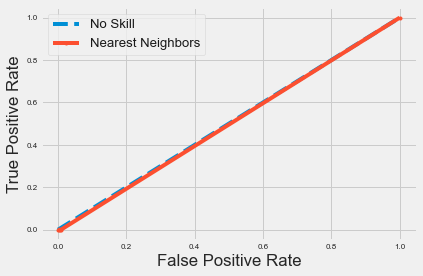

Classification Report Nearest Neighbors
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        95
           0       0.86      1.00      0.92       577

    accuracy                           0.86       672
   macro avg       0.43      0.50      0.46       672
weighted avg       0.74      0.86      0.79       672

Accuracy: 0.855655
Precision: 0.000000
Recall: 0.000000
F1 score: 0.000000
Cohens kappa: -0.005864
ROC_AUC: 0.498267
[[572   5]
 [ 95   0]]
No Skill: ROC AUC=0.500
Naive Bayes : ROC AUC=0.496


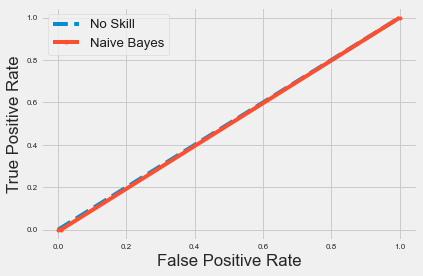

Classification Report Naive Bayes
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        95
           0       0.86      0.99      0.92       577

    accuracy                           0.85       672
   macro avg       0.43      0.50      0.46       672
weighted avg       0.74      0.85      0.79       672

Accuracy: 0.851190
Precision: 0.000000
Recall: 0.000000
F1 score: 0.000000
Cohens kappa: -0.014340
ROC_AUC: 0.495667
[[575   2]
 [ 95   0]]
No Skill: ROC AUC=0.500
Logistic Regression : ROC AUC=0.493


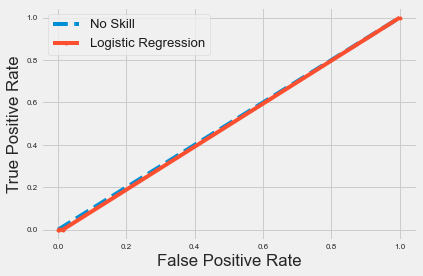

Classification Report Logistic Regression
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        95
           0       0.86      1.00      0.92       577

    accuracy                           0.86       672
   macro avg       0.43      0.50      0.46       672
weighted avg       0.74      0.86      0.79       672

Accuracy: 0.855655
Precision: 0.000000
Recall: 0.000000
F1 score: 0.000000
Cohens kappa: -0.005864
ROC_AUC: 0.498267
[[575   2]
 [ 95   0]]
No Skill: ROC AUC=0.500
Neural Net : ROC AUC=0.489


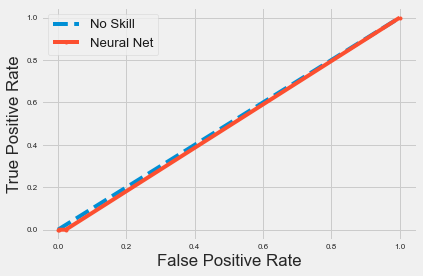

Classification Report Neural Net
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        95
           0       0.86      1.00      0.92       577

    accuracy                           0.86       672
   macro avg       0.43      0.50      0.46       672
weighted avg       0.74      0.86      0.79       672

Accuracy: 0.855655
Precision: 0.000000
Recall: 0.000000
F1 score: 0.000000
Cohens kappa: -0.005864
ROC_AUC: 0.498267
[[577   0]
 [ 95   0]]
No Skill: ROC AUC=0.500
Linear SVM : ROC AUC=0.500


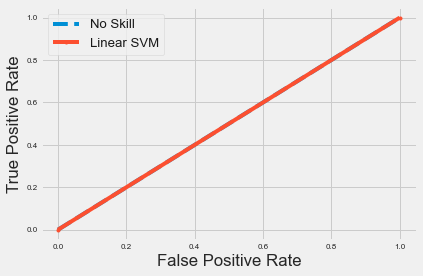

Classification Report Linear SVM
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        95
           0       0.86      1.00      0.92       577

    accuracy                           0.86       672
   macro avg       0.43      0.50      0.46       672
weighted avg       0.74      0.86      0.79       672

Accuracy: 0.858631
Precision: 0.000000
Recall: 0.000000
F1 score: 0.000000
Cohens kappa: 0.000000
ROC_AUC: 0.500000
[[310 267]
 [ 37  58]]
No Skill: ROC AUC=0.500
Gradient Boosting Classifier : ROC AUC=0.588


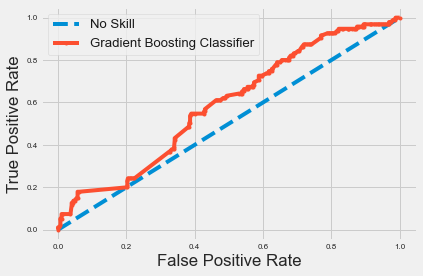

Classification Report Gradient Boosting Classifier
              precision    recall  f1-score   support

           1       0.18      0.61      0.28        95
           0       0.89      0.54      0.67       577

    accuracy                           0.55       672
   macro avg       0.54      0.57      0.47       672
weighted avg       0.79      0.55      0.62       672

Accuracy: 0.547619
Precision: 0.178462
Recall: 0.610526
F1 score: 0.276190
Cohens kappa: 0.073482
ROC_AUC: 0.573894
[[270 307]
 [ 31  64]]
No Skill: ROC AUC=0.500
Decision Tree : ROC AUC=0.570


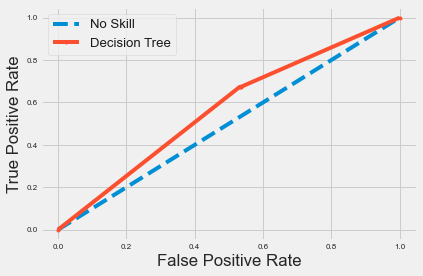

Classification Report Decision Tree
              precision    recall  f1-score   support

           1       0.17      0.67      0.27        95
           0       0.90      0.47      0.62       577

    accuracy                           0.50       672
   macro avg       0.53      0.57      0.44       672
weighted avg       0.79      0.50      0.57       672

Accuracy: 0.497024
Precision: 0.172507
Recall: 0.673684
F1 score: 0.274678
Cohens kappa: 0.063982
ROC_AUC: 0.570811
[[541  36]
 [ 80  15]]
No Skill: ROC AUC=0.500
Random Forest : ROC AUC=0.534


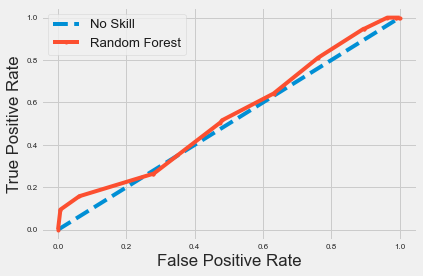

Classification Report Random Forest
              precision    recall  f1-score   support

           1       0.29      0.16      0.21        95
           0       0.87      0.94      0.90       577

    accuracy                           0.83       672
   macro avg       0.58      0.55      0.55       672
weighted avg       0.79      0.83      0.80       672

Accuracy: 0.827381
Precision: 0.294118
Recall: 0.157895
F1 score: 0.205479
Cohens kappa: 0.118409
ROC_AUC: 0.547752
[16:01:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[202 375]
 [ 16  79]]
No Skill: ROC AUC=0.500
XGBoost : ROC AUC=0.655


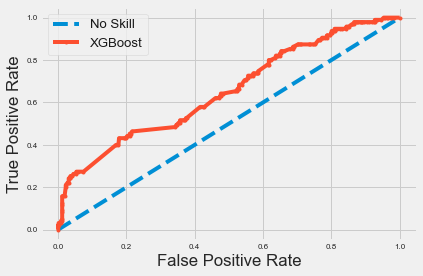

Classification Report XGBoost
              precision    recall  f1-score   support

           1       0.17      0.83      0.29        95
           0       0.93      0.35      0.51       577

    accuracy                           0.42       672
   macro avg       0.55      0.59      0.40       672
weighted avg       0.82      0.42      0.48       672

Accuracy: 0.418155
Precision: 0.174009
Recall: 0.831579
F1 score: 0.287796
Cohens kappa: 0.070457
ROC_AUC: 0.590833
[[570   7]
 [ 82  13]]
No Skill: ROC AUC=0.500
AdaBoost : ROC AUC=0.640


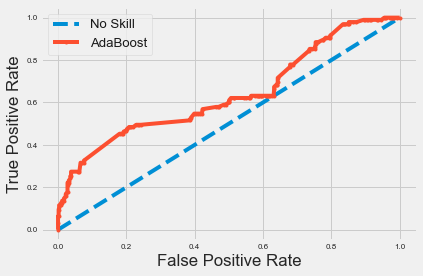

Classification Report AdaBoost
              precision    recall  f1-score   support

           1       0.65      0.14      0.23        95
           0       0.87      0.99      0.93       577

    accuracy                           0.87       672
   macro avg       0.76      0.56      0.58       672
weighted avg       0.84      0.87      0.83       672

Accuracy: 0.867560
Precision: 0.650000
Recall: 0.136842
F1 score: 0.226087
Cohens kappa: 0.186064
ROC_AUC: 0.562355
[[564  13]
 [ 78  17]]
No Skill: ROC AUC=0.500
Light GBM : ROC AUC=0.654


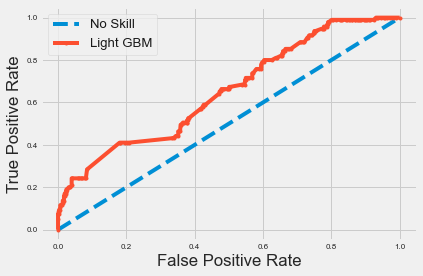

Classification Report Light GBM
              precision    recall  f1-score   support

           1       0.57      0.18      0.27        95
           0       0.88      0.98      0.93       577

    accuracy                           0.86       672
   macro avg       0.72      0.58      0.60       672
weighted avg       0.83      0.86      0.83       672

Accuracy: 0.864583
Precision: 0.566667
Recall: 0.178947
F1 score: 0.272000
Cohens kappa: 0.219004
ROC_AUC: 0.578209


,classifier,train_score,test_score,precision,recall,f1_score,cohens_kappa,roc_auc
0,Nearest Neighbors,0.923251,0.855655,0.000000,0.000000,0.000000,-0.005864,0.498267
1,Naive Bayes,0.752822,0.851190,0.000000,0.000000,0.000000,-0.014340,0.495667
2,Logistic Regression,0.827314,0.855655,0.000000,0.000000,0.000000,-0.005864,0.498267
3,Neural Net,0.829195,0.855655,0.000000,0.000000,0.000000,-0.005864,0.498267
4,Linear SVM,0.904063,0.858631,0.000000,0.000000,0.000000,0.000000,0.500000
5,Gradient Boosting Classifier,0.969150,0.547619,0.178462,0.610526,0.276190,0.073482,0.573894
6,Decision Tree,0.996614,0.497024,0.172507,0.673684,0.274678,0.063982,0.570811
7,Random Forest,0.996238,0.827381,0.294118,0.157895,0.205479,0.118409,0.547752
8,XGBoost,0.996238,0.418155,0.174009,0.831579,0.287796,0.070457,0.590833
9,AdaBoost,0.919488,0.867560,0.650000,0.136842,0.226087,0.186064,0.562355


In [48]:
df = batch_classify(X_train,testX,testY,Y_train, verbose=True)
df